In [2]:
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 905.3/905.3 kB 16.1 MB/s eta 0:00:00


In [ ]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml

from PIL import Image
from ultralytics import YOLO
from IPython.display import Video

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
model = YOLO('yolov9c.pt')

100%|██████████| 49.4M/49.4M [00:00<00:00, 341MB/s]


In [ ]:
import yaml
# Define the dataset_path
dataset_path = '/kaggle/input/nut-bolt-dataset'

# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

# Load and print the contents of the YAML file
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))


names:
- Drywall screw
- Large nut
- Tiny nut
- Tiny pan head machine screw
- flat head screw
- medium nut
- pan head machine screw
- small nut
- small wood screw
- threaded nail
- truss head machine screw
- wood screw
- wood screw full thread
nc: 13
roboflow:
  license: Public Domain
  project: screw-it
  url: https://universe.roboflow.com/screw-it-ss9am/screw-it/dataset/2
  version: 2
  workspace: screw-it-ss9am
test: ../test/images
train: ../train/images
val: ../valid/images



In [ ]:
# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'):
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")


Number of training images: 188
Number of validation images: 54
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


<function matplotlib.pyplot.show(close=None, block=None)>

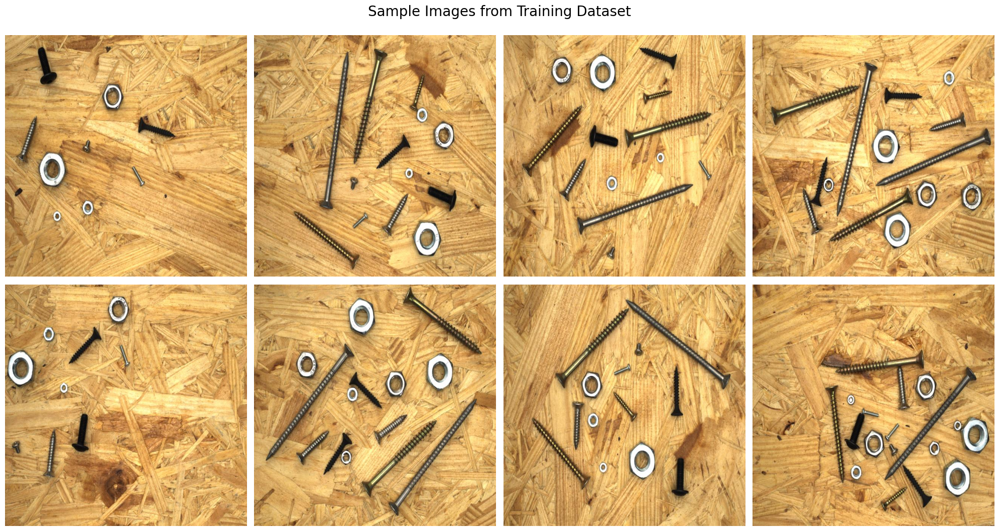

In [ ]:
# List all jpg images in the directory
image_files = [file for file in os.listdir(train_images_path) if file.endswith('.jpg')]

# Select 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

# Create a 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(20, 11))

# Display each of the selected images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_images_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')

plt.suptitle('Sample Images from Training Dataset', fontsize=20)
plt.tight_layout()
plt.show



In [ ]:
# Train the model on our custom dataset
results = model.train(
    data=yaml_file_path,     # Path to the dataset configuration file
    epochs=10,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
             # Epochs to wait for no observable improvement for early stopping of training
    batch=8,                # Number of images per batch
                 # Random seed for reproducibility
)




Ultralytics 8.3.56 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.pt, data=/kaggle/input/nut-bolt-dataset/data.yaml, epochs=10, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_co

100%|██████████| 755k/755k [00:00<00:00, 23.7MB/s]


Overriding model.yaml nc=80 with nc=13

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    212864  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 256, 128, 64, 1]        
  3                  -1  1    164352  ultralytics.nn.modules.block.ADown           [256, 256]                    
  4                  -1  1    847616  ultralytics.nn.modules.block.RepNCSPELAN4    [256, 512, 256, 128, 1]       
  5                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
  6                  -1  1   2857472  ultralytics.nn.modules.block.RepNCSPELAN4    [512, 512, 512, 256, 1]       
  7                  -1  1    656384  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 102MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/nut-bolt-dataset/train/labels... 188 images, 0 backgrounds, 0 corrupt: 100%|██████████| 188/188 [00:00<00:00, 242.39it/s]

train: WARNING ⚠️ /kaggle/input/nut-bolt-dataset/train/images/screws_089_png.rf.4a820d86adbd0a92e74684ba688ef8f8.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/input/nut-bolt-dataset/train/images/screws_125_png.rf.7e4c9a560ac602cc655e2efc241ba3a3.jpg: 1 duplicate labels removed
train: WARNING ⚠️ Cache directory /kaggle/input/nut-bolt-dataset/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/nut-bolt-dataset/valid/labels... 54 images, 0 backgrounds, 0 corrupt: 100%|██████████| 54/54 [00:00<00:00, 173.16it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/nut-bolt-dataset/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000588, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.29G     0.6165      2.657     0.9698         58        640: 100%|██████████| 24/24 [00:13<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.78it/s]

                   all         54        629      0.622      0.871      0.812      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      6.25G     0.4997     0.9429      0.857         50        640: 100%|██████████| 24/24 [00:11<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.59it/s]

                   all         54        629      0.777      0.908      0.895      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      6.21G     0.4834     0.8131     0.8505         63        640: 100%|██████████| 24/24 [00:11<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.64it/s]

                   all         54        629      0.867      0.885      0.935      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      6.25G     0.4765     0.6591     0.8483         49        640: 100%|██████████| 24/24 [00:11<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.61it/s]

                   all         54        629      0.883      0.939       0.96      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      6.24G     0.4668      0.563     0.8448         48        640: 100%|██████████| 24/24 [00:11<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.57it/s]

                   all         54        629      0.902      0.906       0.96      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      6.24G     0.4401     0.5271     0.8442         57        640: 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.65it/s]

                   all         54        629      0.917      0.938      0.968      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      6.25G     0.4195     0.4645     0.8337         48        640: 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.68it/s]

                   all         54        629      0.936      0.945      0.979        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      6.24G     0.4151     0.4212     0.8353         47        640: 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.70it/s]

                   all         54        629       0.96      0.969       0.98      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      6.24G     0.3957     0.4017     0.8267         47        640: 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.68it/s]

                   all         54        629      0.913      0.923      0.948       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      6.24G     0.3751     0.3591     0.8231         43        640: 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.70it/s]

                   all         54        629      0.958      0.951      0.977      0.914



10 epochs completed in 0.044 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 51.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 51.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.56 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv9c summary (fused): 384 layers, 25,329,271 parameters, 0 gradients, 102.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.78it/s]


                   all         54        629      0.958       0.95      0.977      0.913
         Drywall screw         54         82      0.999          1      0.995      0.973
             Large nut         34         44      0.989      0.977      0.977      0.958
              Tiny nut         45         64          1      0.706      0.995      0.866
Tiny pan head machine screw         26         28      0.964      0.961      0.964      0.806
       flat head screw         54         82      0.958          1      0.995      0.941
            medium nut         36         47      0.954          1      0.995      0.974
pan head machine screw         27         29          1      0.988      0.995      0.884
             small nut         36         47      0.683          1      0.926       0.85
      small wood screw         26         28       0.99      0.929      0.967      0.885
         threaded nail         33         43      0.996      0.977      0.976      0.924
truss head machi

In [ ]:
post_training_files_path = '/kaggle/working/runs/detect/train'

# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics 8.3.56 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv9c summary (fused): 384 layers, 25,329,271 parameters, 0 gradients, 102.4 GFLOPs


val: Scanning /kaggle/input/nut-bolt-dataset/valid/labels... 54 images, 0 backgrounds, 0 corrupt: 100%|██████████| 54/54 [00:00<00:00, 560.69it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/nut-bolt-dataset/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.33it/s]


                   all         54        629      0.958       0.95      0.977      0.915
         Drywall screw         54         82      0.999          1      0.995      0.974
             Large nut         34         44      0.989      0.977      0.977      0.961
              Tiny nut         45         64          1      0.707      0.995      0.867
Tiny pan head machine screw         26         28      0.964      0.961      0.964      0.822
       flat head screw         54         82      0.957          1      0.995      0.946
            medium nut         36         47      0.953          1      0.995      0.971
pan head machine screw         27         29          1      0.988      0.995      0.876
             small nut         36         47      0.682          1      0.925      0.853
      small wood screw         26         28       0.99      0.929      0.967      0.888
         threaded nail         33         43      0.996      0.977      0.976      0.922
truss head machi


image 1/1 /kaggle/input/nut-bolt-dataset/valid/images/screws_382_png.rf.7555108d3a93590990df06f1f72fa543.jpg: 640x640 1 Drywall screw, 1 Large nut, 1 Tiny pan head machine screw, 1 flat head screw, 1 medium nut, 1 pan head machine screw, 2 small nuts, 1 small wood screw, 1 threaded nail, 1 truss head machine screw, 1 wood screw, 1 wood screw full thread, 23.7ms
Speed: 2.3ms preprocess, 23.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/nut-bolt-dataset/valid/images/screws_331_png.rf.243d9f32ae7211bc0fc1ca35a7a92c61.jpg: 640x640 2 Drywall screws, 2 flat head screws, 2 medium nuts, 2 small nuts, 23.8ms
Speed: 2.0ms preprocess, 23.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/nut-bolt-dataset/valid/images/screws_098_png.rf.d980383dc8014406031906f43203b43a.jpg: 640x640 2 Drywall screws, 1 Large nut, 1 Tiny nut, 1 Tiny pan head machine screw, 2 flat head screws, 1 medium nut, 1 pan head machine sc

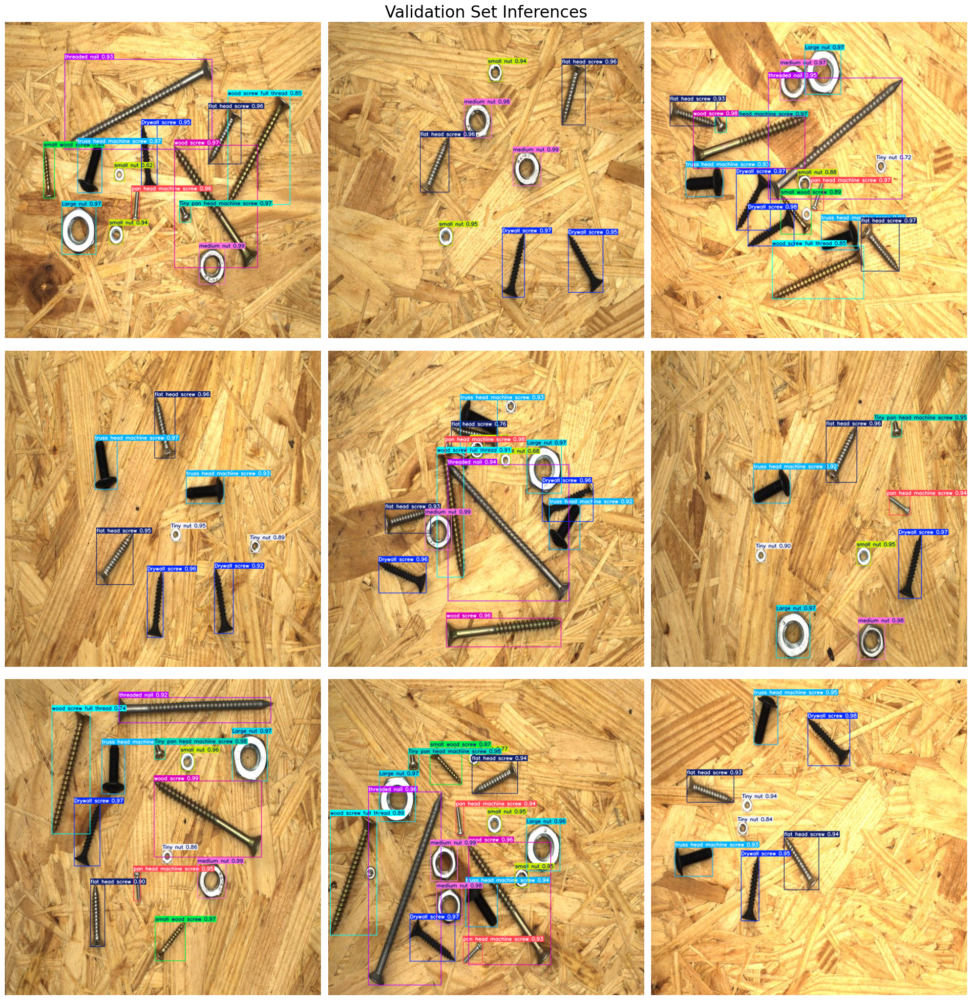

In [ ]:
# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
    annotated_image = results[0].plot(line_width=1)
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()


image 1/1 /kaggle/input/nut-bolt-dataset/test/images/screws_006_png.rf.082d8bd09b49efc1bc81c9757ddf0e0c.jpg: 640x640 2 Drywall screws, 1 Tiny nut, 2 flat head screws, 1 small nut, 2 small wood screws, 2 threaded nails, 2 truss head machine screws, 1 wood screw, 2 wood screw full threads, 23.7ms
Speed: 2.2ms preprocess, 23.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


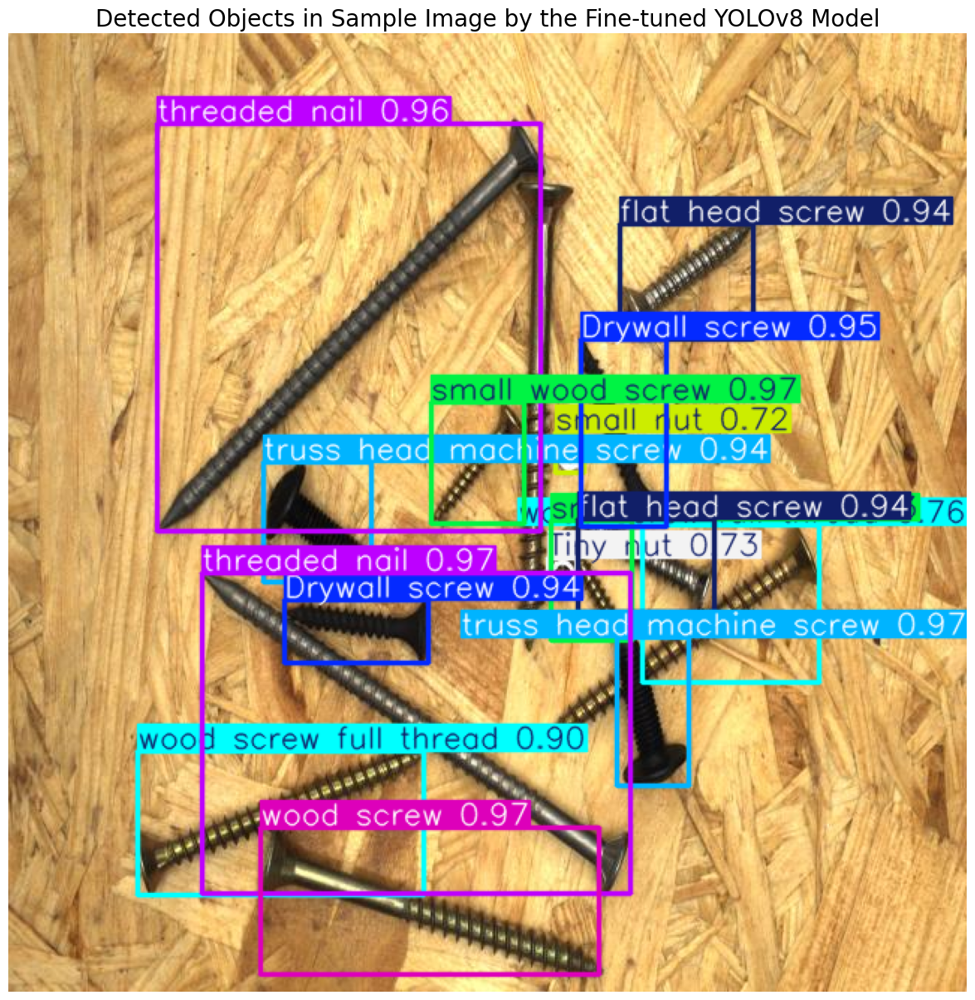

In [ ]:
# Path to the image file
sample_image_path = '/kaggle/input/nut-bolt-dataset/test/images/screws_006_png.rf.082d8bd09b49efc1bc81c9757ddf0e0c.jpg'

# Perform inference on the provided image using best model
results = best_model.predict(source=sample_image_path, imgsz=640, conf=0.7)

# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Fine-tuned YOLOv8 Model', fontsize=20)
plt.axis('off')
plt.show()

## Build Gradio UI

In [1]:
!pip install gradio -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 MB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.4/320.4 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 94.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 4.7 MB/s eta 0:00:00


In [3]:
import gradio as gr
from ultralytics import YOLO
import cv2
import numpy as np

# Load the YOLOv9 model
best_model_path = '/content/Blot-trained-model.pt'
best_model = YOLO(best_model_path)

def predict_image(img):
    """
    Performs object detection on the input image and returns the annotated image.

    Args:
        img: The input image (as a NumPy array from Gradio).

    Returns:
        The annotated image with bounding boxes and labels (as a NumPy array).
    """
    results = best_model.predict(source=img, imgsz=640, conf=0.5)
    annotated_image = results[0].plot()

    return annotated_image

# Create the Gradio interface with an upload button
def create_ui():
    with gr.Blocks() as demo:
        gr.Markdown("# YOLOv9 Object Detection for Nuts and Bolts")
        gr.Markdown("Upload an image and click 'Detect Objects' to see the model's predictions.")

        with gr.Row():
            inp = gr.Image(label="Upload Image")
            out = gr.Image(label="Detected Objects", type="numpy")

        btn = gr.Button("Detect Objects")
        btn.click(fn=predict_image, inputs=inp, outputs=out)

    return demo

# Launch the Gradio app
if __name__ == "__main__":
    ui = create_ui()
    ui.launch(debug=True)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://dac66f7c538be348b2.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)



0: 640x640 1 Drywall screw, 1 Large nut, 1 Tiny nut, 1 Tiny pan head machine screw, 1 flat head screw, 1 pan head machine screw, 1 small nut, 1 small wood screw, 1 threaded nail, 1 truss head machine screw, 1 wood screw full thread, 2544.5ms
Speed: 31.6ms preprocess, 2544.5ms inference, 42.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Drywall screws, 3 Large nuts, 2 flat head screws, 2 medium nuts, 2 small nuts, 2 threaded nails, 2 wood screws, 2292.2ms
Speed: 10.8ms preprocess, 2292.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Drywall screws, 3 Large nuts, 2 flat head screws, 2 medium nuts, 2 small nuts, 2 threaded nails, 2 wood screws, 2483.1ms
Speed: 5.6ms preprocess, 2483.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 384x640 5 Large nuts, 1 flat head screw, 1 small nut, 4 wood screws, 1369.6ms
Speed: 12.7ms preprocess, 1369.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 3